In [ ]:
!pip install transformers[torch] datasets -q

In [ ]:
import requests
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForQuestionAnswering,BlipImageProcessor, AutoProcessor
from transformers import BlipConfig
from datasets import load_dataset
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
dataset = load_dataset("flaviagiammarino/path-vqa")

Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /root/.cache/huggingface/datasets/parquet/flaviagiammarino--path-vqa-77e24095dbbb9822/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 19654
    })
    test: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6719
    })
    validation: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6259
    })
})

Question: what are stained here with an immunohistochemical stain for cytokeratin 7?
Answer: bile duct cells and canals of hering


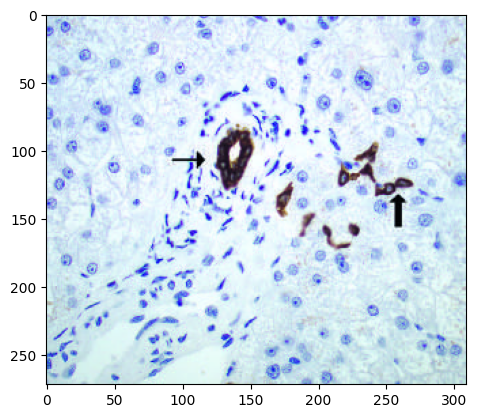

In [ ]:
sample = dataset['train'][1]
PIL_image = Image.fromarray(np.array(sample['image'])).convert('RGB')
plt.imshow(sample['image'].convert('RGB'))
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

In [ ]:
config = BlipConfig.from_pretrained("Salesforce/blip-vqa-base")

In [ ]:
train_data = dataset['train'].select(range(10000))
val_data = dataset['validation'].select(range(1000))

import torch
from torch.utils.data import Dataset
from PIL import Image
from transformers import AutoTokenizer

class MultimodalDataset(Dataset):
    def __init__(self, image_paths, texts, labels, transform=None):
        self.image_paths = image_paths
        self.texts = texts
        self.labels = labels
        self.transform = transform
        self.tokenizer = AutoTokenizer.from_pretrained('dmis-lab/biobert-v1.1')

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Load and transform image
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')  # Adjust path as needed
        if self.transform is not None:
            image = self.transform(image)

        # Encode text using BioBERT tokenizer
        text = self.texts[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            padding='max_length',
            max_length=128,  # Adjust as needed
            return_tensors='pt'
        )
        input_ids = encoding['input_ids'].squeeze()
        attention_mask = encoding['attention_mask'].squeeze()

        # Get label
        label = self.labels[idx]

        return image, input_ids, attention_mask, label


In [ ]:
 def __getitem__(self, idx):
        # Load and transform image
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')  # Adjust path as needed
        if self.transform is not None:
            image = self.transform(image)

        # Encode text using BioBERT tokenizer
        text = self.texts[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            padding='max_length',
            max_length=128,  # Adjust as needed
            return_tensors='pt'
        )
        input_ids = encoding['input_ids'].squeeze()
        attention_mask = encoding['attention_mask'].squeeze()

        # Get label
        label = self.labels[idx]

        return image, input_ids, attention_mask, label

In [ ]:
class VQADataset(torch.utils.data.Dataset):
    def __init__(self, data, segment, text_processor, image_processor):
        self.data = data
        self.questions = data['question']
        self.answers = data['answer']
        self.text_processor = text_processor
        self.image_processor = image_processor
        self.max_length = 32
        self.image_height = 128
        self.image_width = 128

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # get image + text
        answers = self.answers[idx]
        questions = self.questions[idx]
        image = self.data[idx]['image'].convert('RGB')
        text = self.questions[idx]

        image_encoding = self.image_processor(image,
                                  do_resize=True,
                                  size=(self.image_height,self.image_width),
                                  return_tensors="pt")

        encoding = self.text_processor(
                                  None,
                                  text,
                                  padding="max_length",
                                  truncation=True,
                                  max_length = self.max_length,
                                  return_tensors="pt"
                                  )
        # # remove batch dimension
        for k,v in encoding.items():
            encoding[k] = v.squeeze()
        encoding["pixel_values"] = image_encoding["pixel_values"][0]
        # # add labels
        labels = self.text_processor.tokenizer.encode(
            answers,
            max_length= self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors='pt'
        )[0]
        encoding["labels"] = labels

        return encoding

In [ ]:
text_processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
image_processor = BlipImageProcessor.from_pretrained("Salesforce/blip-vqa-base")

In [ ]:
train_vqa_dataset = VQADataset(data=train_data,
                     segment='train',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

val_vqa_dataset = VQADataset(data=train_data,
                     segment='validation',
                     text_processor = text_processor,
                     image_processor = image_processor
                         )

In [ ]:
train_vqa_dataset[0]

{'input_ids': tensor([  101,  2073,  2024, 11290,  7872,  4442,  1006,  9242,  4442,  1007,
         2284,  1029,   102,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[0.6895, 0.8647, 0.9814,  ..., 0.9668, 1.2150, 1.4194],
         [1.0252, 0.9814, 1.0106,  ..., 1.0398, 1.3902, 1.2880],
         [0.9960, 1.0836, 0.8501,  ..., 1.0398, 1.2442, 1.1420],
         ...,
         [0.9668, 0.5581, 0.0617,  ..., 1.0106, 0.9376, 0.8792],
         [0.7917, 0.9960, 0.8647,  ..., 1.1420, 1.0252, 0.9230],
         [0.5581, 0.9522, 0.9376,  ..., 1.1420, 0.9376, 0.9668]],

        [[1.1594, 1.3995, 1.5196,  ..., 1.3695, 1.6247, 1.8948],
         [1.5946, 1.4746, 1.5046,  ..., 1.4446, 1.8047, 1.6847],
         [1.5196, 1.5946, 1.5196,  ..., 1.47

In [ ]:
def collate_fn(batch):
    input_ids = [item['input_ids'] for item in batch]
    pixel_values = [item['pixel_values'] for item in batch]
    attention_mask = [item['attention_mask'] for item in batch]
    labels = [item['labels'] for item in batch]
    # create new batch
    batch = {}
    batch['input_ids'] = torch.stack(input_ids)
    batch['attention_mask'] = torch.stack(attention_mask)
    batch['pixel_values'] = torch.stack(pixel_values)
    batch['labels'] = torch.stack(labels)

    return batch

train_dataloader = DataLoader(train_vqa_dataset,
                              collate_fn=collate_fn,
                              batch_size=64,
                              shuffle=False)
val_dataloader = DataLoader(val_vqa_dataset,
                            collate_fn=collate_fn,
                            batch_size=64,
                            shuffle=False)

In [ ]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
    print(k, v.shape)

input_ids torch.Size([64, 32])
attention_mask torch.Size([64, 32])
pixel_values torch.Size([64, 3, 128, 128])
labels torch.Size([64, 32])


In [ ]:
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base" )
model.to(device)

BlipForQuestionAnswering(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-05, e

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
image_mean = image_processor.image_mean
image_std = image_processor.image_std

Question:  [CLS] what are stained here with an immunohistochemical stain for cytokeratin 7? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Answer:  [CLS] bile duct cells and canals of hering [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


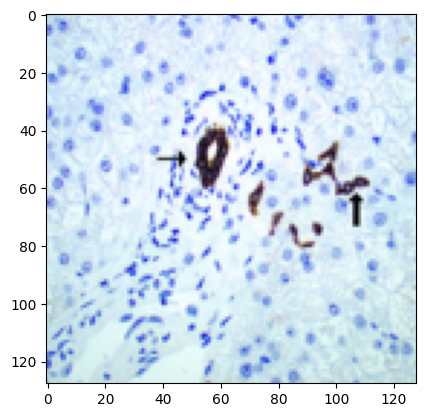

In [ ]:
batch_idx = 1

unnormalized_image = (batch["pixel_values"][batch_idx].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)

print("Question: ",text_processor.decode(batch["input_ids"][batch_idx]))
print("Answer: ",text_processor.decode(batch["labels"][batch_idx]))
plt.imshow(Image.fromarray(unnormalized_image))

class MFBPooling(nn.Module):
    def __init__(self, image_dim, text_dim, output_dim, k):
        """
        image_dim: Dimension of image features
        text_dim: Dimension of text features
        output_dim: Dimension of output feature vector
        k: Number of factors in factorized bilinear pooling
        """
        super(MFBPooling, self).__init__()
        self.output_dim = output_dim
        self.k = k
        self.linear_img = nn.Linear(image_dim, output_dim * k)
        self.linear_txt = nn.Linear(text_dim, output_dim * k)

    def forward(self, img_features, txt_features):
        # Apply linear transformations
        img_features = self.linear_img(img_features)  # Shape: [batch_size, output_dim * k]
        txt_features = self.linear_txt(txt_features)  # Shape: [batch_size, output_dim * k]

        # Element-wise multiplication
        fused_features = img_features * txt_features  # Shape: [batch_size, output_dim * k]

        # Reshape and sum across k dimensions
        fused_features = fused_features.reshape(-1, self.output_dim, self.k)
        fused_features = torch.sum(fused_features, dim=2)  # Shape: [batch_size, output_dim]

        return fused_features

In [ ]:
model.train()
for epoch in range(90):
    print(f"Epoch: {epoch}")
    total_loss = []
    for batch in tqdm(train_dataloader):
        # get the inputs;
        batch = {k:v.to(device) for k,v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        total_loss.append(loss.item())
        loss.backward()
        optimizer.step()
    print("Loss:", sum(total_loss))

Epoch: 0


  0%|          | 0/157 [00:00<?, ?it/s]

We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


Loss: 574.7836776971817
Epoch: 1


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 257.98637652397156
Epoch: 2


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 249.79364371299744
Epoch: 3


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 244.079598903656
Epoch: 4


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 239.29888260364532
Epoch: 5


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 235.4876273870468
Epoch: 6


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 232.84861755371094
Epoch: 7


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 230.61730003356934
Epoch: 8


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 229.09221410751343
Epoch: 9


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 227.45366883277893
Epoch: 10


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 226.34723448753357
Epoch: 11


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 225.8037050962448
Epoch: 12


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 225.02576446533203
Epoch: 13


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 224.46152532100677
Epoch: 14


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.5590137243271
Epoch: 15


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.07532668113708
Epoch: 16


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.6379153728485
Epoch: 17


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.42142593860626
Epoch: 18


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.47393131256104
Epoch: 19


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.94616162776947
Epoch: 20


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 223.18263936042786
Epoch: 21


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.12748336791992
Epoch: 22


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.2539690732956
Epoch: 23


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.34721660614014
Epoch: 24


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.26100766658783
Epoch: 25


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.99845600128174
Epoch: 26


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.3441573381424
Epoch: 27


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.36455392837524
Epoch: 28


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.0430554151535
Epoch: 29


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.91980969905853
Epoch: 30


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.41160607337952
Epoch: 31


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.51174652576447
Epoch: 32


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.34938299655914
Epoch: 33


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.90098428726196
Epoch: 34


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.3445771932602
Epoch: 35


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.4291136264801
Epoch: 36


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.59738612174988
Epoch: 37


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.5332728624344
Epoch: 38


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.38088250160217
Epoch: 39


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.83425199985504
Epoch: 40


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.91401755809784
Epoch: 41


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.80622029304504
Epoch: 42


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.65493595600128
Epoch: 43


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.32324969768524
Epoch: 44


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.2114714384079
Epoch: 45


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.3374228477478
Epoch: 46


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.1834797859192
Epoch: 47


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.24029111862183
Epoch: 48


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.00896060466766
Epoch: 49


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.29427766799927
Epoch: 50


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.86431348323822
Epoch: 51


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.62877070903778
Epoch: 52


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 222.3192697763443
Epoch: 53


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.44102275371552
Epoch: 54


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.51881623268127
Epoch: 55


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.58459746837616
Epoch: 56


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.6509599685669
Epoch: 57


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.40351796150208
Epoch: 58


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.31650459766388
Epoch: 59


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.23700940608978
Epoch: 60


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.33909463882446
Epoch: 61


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.28254163265228
Epoch: 62


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.1769061088562
Epoch: 63


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.16842317581177
Epoch: 64


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.15162861347198
Epoch: 65


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.16650259494781
Epoch: 66


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.00051546096802
Epoch: 67


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.02214908599854
Epoch: 68


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.01351964473724
Epoch: 69


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.8832778930664
Epoch: 70


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.02586126327515
Epoch: 71


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.73871207237244
Epoch: 72


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.57244634628296
Epoch: 73


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.4587084054947
Epoch: 74


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.42365729808807
Epoch: 75


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.6499571800232
Epoch: 76


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.5023900270462
Epoch: 77


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.1287806034088
Epoch: 78


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.07679069042206
Epoch: 79


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.12000811100006
Epoch: 80


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.8427780866623
Epoch: 81


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.70872151851654
Epoch: 82


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.66473019123077
Epoch: 83


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.74199163913727
Epoch: 84


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.01178693771362
Epoch: 85


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 221.20216274261475
Epoch: 86


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.70832359790802
Epoch: 87


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.52759456634521
Epoch: 88


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.39693200588226
Epoch: 89


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 220.27243375778198


In [ ]:
class CoarseAttention(nn.Module):
    def __init__(self, fusion_dim, attention_dim):
        super(CoarseAttention, self).__init__()
        self.image_attention = nn.Linear(fusion_dim, attention_dim)
        self.text_attention = nn.Linear(fusion_dim, attention_dim)
        self.final_attention = nn.Linear(attention_dim, 1)

    def forward(self, image_features, text_features):
        # Assuming image_features and text_features are already fused and have same dimension
        image_attention_weights = torch.tanh(self.image_attention(image_features))
        text_attention_weights = torch.tanh(self.text_attention(text_features))

        combined_attention = image_attention_weights + text_attention_weights
        attention_weights = torch.softmax(self.final_attention(combined_attention), dim=1)

        return attention_weights * image_features


In [ ]:
class FineAttention(nn.Module):
    def __init__(self, fusion_dim, num_heads):
        super(FineAttention, self).__init__()
        self.multihead_attn = nn.MultiheadAttention(embed_dim=fusion_dim, num_heads=num_heads)

    def forward(self, key, value, query):
        # key, value, and query are the same in self-attention
        attn_output, _ = self.multihead_attn(query, key, value)
        return attn_output

Question:  where are liver stem cells ( oval cells ) located?


/opt/conda/lib/python3.10/site-packages/transformers/generation/utils.py:1260: UserWarning: Using the model-agnostic default `max_length` (=20) to control thegeneration length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Predicted Answer:  in the canals of hering
Actual Answer:  in the canals of hering


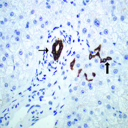

###################################################################
Question:  what are stained here with an immunohistochemical stain for cytokeratin 7?
Predicted Answer:  bile duct cells and canals of hering
Actual Answer:  bile duct cells and canals of hering


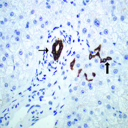

###################################################################
Question:  what do the areas of white chalky deposits represent?
Predicted Answer:  foci of fat necrosis
Actual Answer:  foci of fat necrosis


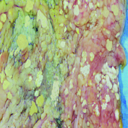

###################################################################
Question:  is embolus derived from a lower - extremity deep venous thrombus lodged in a pulmonary artery branch?
Predicted Answer:  yes
Actual Answer:  yes


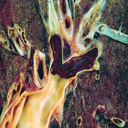

###################################################################
Question:  how is hyperplasia without atypia characterized?
Predicted Answer:  by nests of closely packed glands
Actual Answer:  by nests of closely packed glands


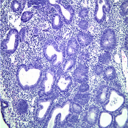

###################################################################
Question:  is normal palmar creases present?
Predicted Answer:  no
Actual Answer:  no


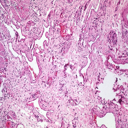

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


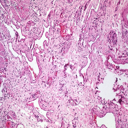

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


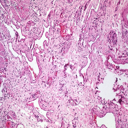

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  esophagus


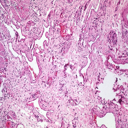

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  varices


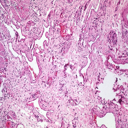

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  excellent photo typical adenocarcinoma extending through muscularis to serosa


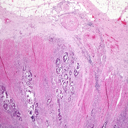

###################################################################
Question:  does this image show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  yes
Actual Answer:  yes


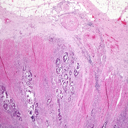

###################################################################
Question:  does typical tuberculous exudate show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  no
Actual Answer:  no


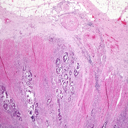

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


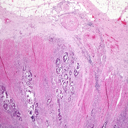

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


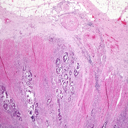

###################################################################
Question:  is hyperplasia without atypia characterized by nests of closely packed glands?
Predicted Answer:  yes
Actual Answer:  yes


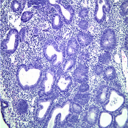

###################################################################
Question:  is mucoepidermoid carcinoma present?
Predicted Answer:  no
Actual Answer:  no


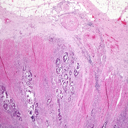

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


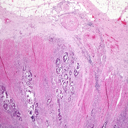

###################################################################
Question:  is colon present?
Predicted Answer:  yes
Actual Answer:  yes


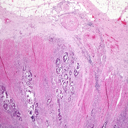

###################################################################
Question:  is edema present?
Predicted Answer:  no
Actual Answer:  no


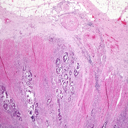

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


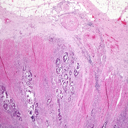

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


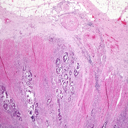

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


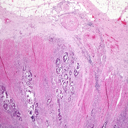

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  typical infiltrating adenocarcinoma


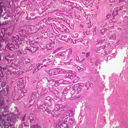

###################################################################
Question:  does this image show typical infiltrating adenocarcinoma?
Predicted Answer:  yes
Actual Answer:  yes


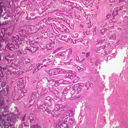

###################################################################
Question:  does retroperitoneal leiomyosarcoma show typical infiltrating adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


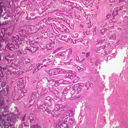

###################################################################
Question:  is endoscopic view of a longitudinally - oriented mallory - weiss characterized by nests of closely packed glands?
Predicted Answer:  no
Actual Answer:  no


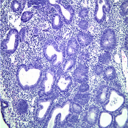

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


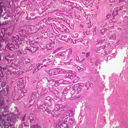

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


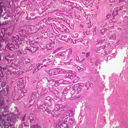

###################################################################
Question:  is adrenal present?
Predicted Answer:  no
Actual Answer:  no


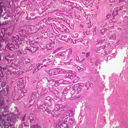

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


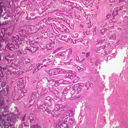

###################################################################
Question:  is colon present?
Predicted Answer:  yes
Actual Answer:  yes


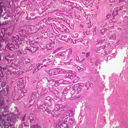

###################################################################
Question:  is coronary artery anomalous origin left from pulmonary artery present?
Predicted Answer:  no
Actual Answer:  no


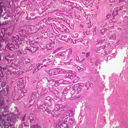

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


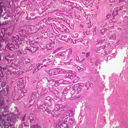

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


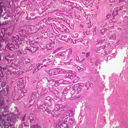

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


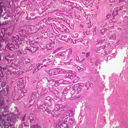

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  typical histology for colon adenocarcinoma


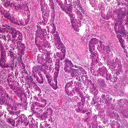

###################################################################
Question:  what is seen as glandular crowding and cellular atypia?
Predicted Answer:  hyperplasia without atypia
Actual Answer:  hyperplasia without atypia


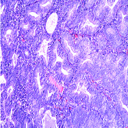

###################################################################
Question:  does this image show typical histology for colon adenocarcinoma?
Predicted Answer:  yes
Actual Answer:  yes


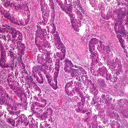

###################################################################
Question:  does amyloid angiopathy r. endocrine show typical histology for colon adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


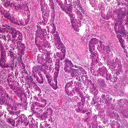

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


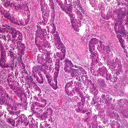

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  yes
Actual Answer:  yes


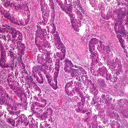

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


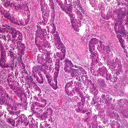

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


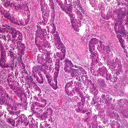

###################################################################
Question:  is colon present?
Predicted Answer:  yes
Actual Answer:  yes


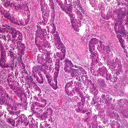

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


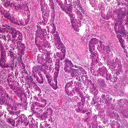

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


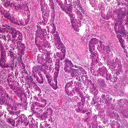

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


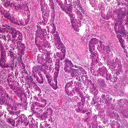

###################################################################
Question:  what is hyperplasia with atypia seen as?
Predicted Answer:  the cartilage cap
Actual Answer:  glandular crowding and cellular atypia


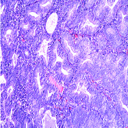

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  colon


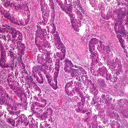

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  typical excellent pinworm


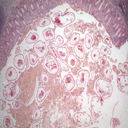

###################################################################
Question:  does this image show typical excellent pinworm?
Predicted Answer:  yes
Actual Answer:  yes


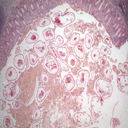

###################################################################
Question:  does acid show typical excellent pinworm?
Predicted Answer:  no
Actual Answer:  no


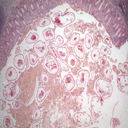

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


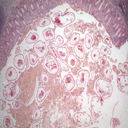

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


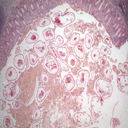

###################################################################
Question:  is myocardium present?
Predicted Answer:  no
Actual Answer:  no


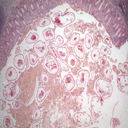

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  appendix


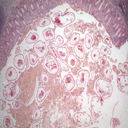

###################################################################
Question:  is appendix present?
Predicted Answer:  yes
Actual Answer:  yes


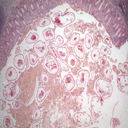

###################################################################
Question:  is carcinoma metastatic lung present?
Predicted Answer:  no
Actual Answer:  no


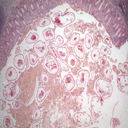

###################################################################
Question:  is hyperplasia with atypia seen as glandular crowding and cellular atypia?
Predicted Answer:  yes
Actual Answer:  yes


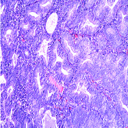

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  pinworm


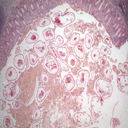

###################################################################
Question:  is pinworm present?
Predicted Answer:  no
Actual Answer:  yes


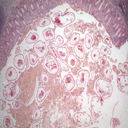

###################################################################
Question:  is normal ovary present?
Predicted Answer:  no
Actual Answer:  no


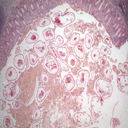

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


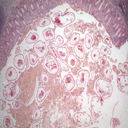

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  gastrointestinal


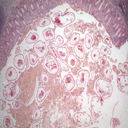

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  appendix


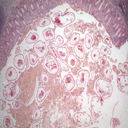

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  pinworm


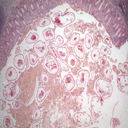

###################################################################
Question:  what does this image show?
Predicted Answer:  the cartilage cap
Actual Answer:  trophozoite source


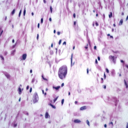

###################################################################
Question:  does this image show trophozoite source?
Predicted Answer:  yes
Actual Answer:  yes


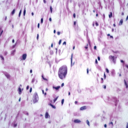

###################################################################
Question:  does glomerulosa show trophozoite source?
Predicted Answer:  no
Actual Answer:  no


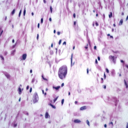

###################################################################
Question:  is a binucleate reed - sternberg cell with large, inclusion - like nucleoli and abundant cytoplasm seen as glandular
Predicted Answer:  no
Actual Answer:  no


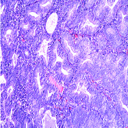

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  gastrointestinal


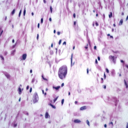

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


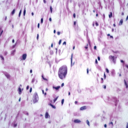

###################################################################
Question:  is metastatic carcinoma prostate present?
Predicted Answer:  no
Actual Answer:  no


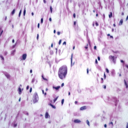

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  colon


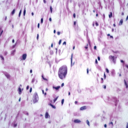

###################################################################
Question:  is colon present?
Predicted Answer:  yes
Actual Answer:  yes


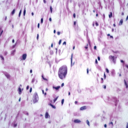

###################################################################
Question:  is appendix present?
Predicted Answer:  yes
Actual Answer:  no


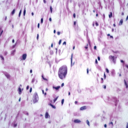

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  amebiasis


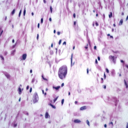

###################################################################
Question:  is amebiasis present?
Predicted Answer:  no
Actual Answer:  yes


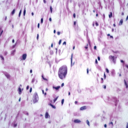

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


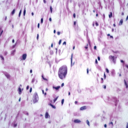

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


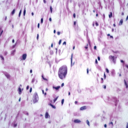

###################################################################
Question:  what shows bundles of normal - looking smooth muscle cells?
Predicted Answer:  the interface between viable non - viable area vessels
Actual Answer:  microscopic appearance of leiomyoma


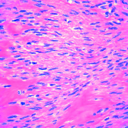

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  gastrointestinal


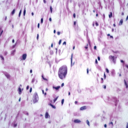

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  colon


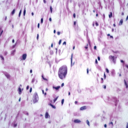

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  amebiasis


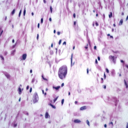

###################################################################
Question:  what does this image show?
Predicted Answer:  the cartilage cap
Actual Answer:  inclusion bodies


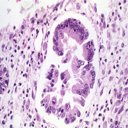

###################################################################
Question:  does this image show inclusion bodies?
Predicted Answer:  yes
Actual Answer:  yes


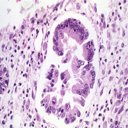

###################################################################
Question:  does atrophy show inclusion bodies?
Predicted Answer:  no
Actual Answer:  no


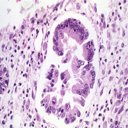

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  gastrointestinal


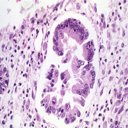

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


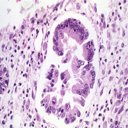

###################################################################
Question:  is antitrypsin present?
Predicted Answer:  no
Actual Answer:  no


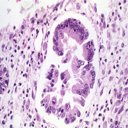

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  stomach


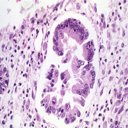

###################################################################
Question:  what does the microscopic appearance of leiomyoma show?
Predicted Answer:  bundles of normal - looking smooth muscle cells
Actual Answer:  bundles of normal - looking smooth muscle cells


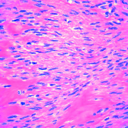

###################################################################
Question:  is stomach present?
Predicted Answer:  yes
Actual Answer:  yes


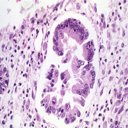

###################################################################
Question:  is cranial artery present?
Predicted Answer:  no
Actual Answer:  no


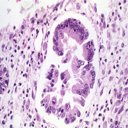

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  cytomegalovirus


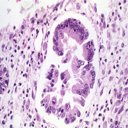

###################################################################
Question:  is cytomegalovirus present?
Predicted Answer:  no
Actual Answer:  yes


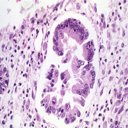

###################################################################
Question:  is acute lymphocytic leukemia present?
Predicted Answer:  no
Actual Answer:  no


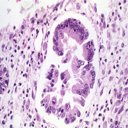

###################################################################
Question:  where is this from?
Predicted Answer:  gastrointestinal system
Actual Answer:  gastrointestinal system


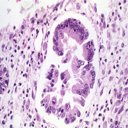

###################################################################
Question:  what is present?
Predicted Answer:  the cartilage cap
Actual Answer:  gastrointestinal


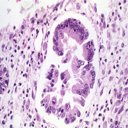

###################################################################


In [ ]:
# add batch dimension + move to GPU|
for x in range(100):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Question:  is cytomegalovirus present?
Predicted Answer:  yes
Actual Answer:  no


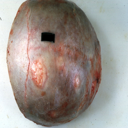

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  metastatic pancreas carcinoma


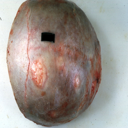

###################################################################
Question:  is metastatic pancreas carcinoma present?
Predicted Answer:  yes
Actual Answer:  yes


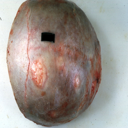

###################################################################
Question:  do the principal cellular alterations that characterize reversible cell injury and necrosis include flat epithelial atypia, adh, and dc
Predicted Answer:  no
Actual Answer:  no


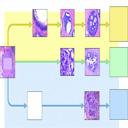

###################################################################
Question:  is eye present?
Predicted Answer:  no
Actual Answer:  no


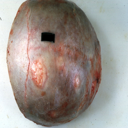

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  bone, calvarium


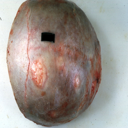

###################################################################
Question:  what is present?
Predicted Answer:  a cluster of basophilic
Actual Answer:  metastatic pancreas carcinoma


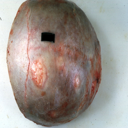

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  several rather large lesions


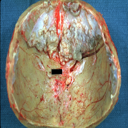

###################################################################
Question:  does this image show several rather large lesions?
Predicted Answer:  yes
Actual Answer:  yes


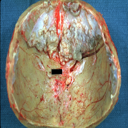

###################################################################
Question:  does opened base of skull with brain show several rather large lesions?
Predicted Answer:  no
Actual Answer:  no


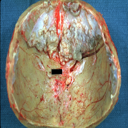

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone


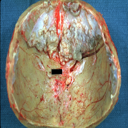

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


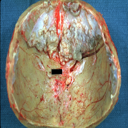

###################################################################
Question:  is medial aspect present?
Predicted Answer:  no
Actual Answer:  no


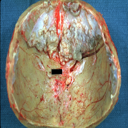

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  exostosis


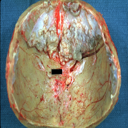

###################################################################
Question:  what are classified as luminal by gene expression profiling?
Predicted Answer:  acute contusions
Actual Answer:  er - positive carcinomas


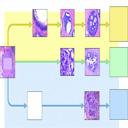

###################################################################
Question:  is exostosis present?
Predicted Answer:  yes
Actual Answer:  yes


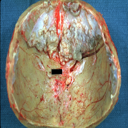

###################################################################
Question:  is umbilical cord present?
Predicted Answer:  no
Actual Answer:  no


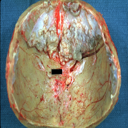

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone, calvarium


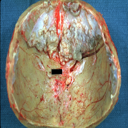

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  exostosis


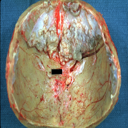

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  close - up view of base of skull with several well shown fractures


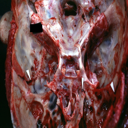

###################################################################
Question:  how does this image show close - up view of base of skull?
Predicted Answer:  with multiple infarcts infiltrative process is easily seen
Actual Answer:  with several well shown fractures


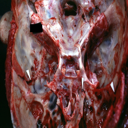

###################################################################
Question:  does this image show close - up view of base of skull with several well shown fractures?
Predicted Answer:  yes
Actual Answer:  yes


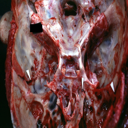

###################################################################
Question:  does amyloid angiopathy r. endocrine show close - up view of base of skull with several well shown fractures?
Predicted Answer:  no
Actual Answer:  no


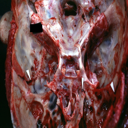

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone


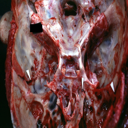

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


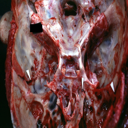

###################################################################
Question:  are these cancers classified as luminal by gene expression profiling?
Predicted Answer:  yes
Actual Answer:  yes


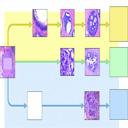

###################################################################
Question:  is myoma lesion present?
Predicted Answer:  no
Actual Answer:  no


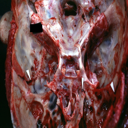

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


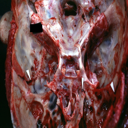

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  yes
Actual Answer:  yes


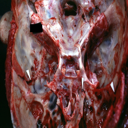

###################################################################
Question:  is hemorrhagic corpus luteum present?
Predicted Answer:  yes
Actual Answer:  no


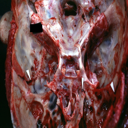

###################################################################
Question:  what well shown fractures?
Predicted Answer:  close - up view of base of skull with several
Actual Answer:  close - up view of base of skull with several


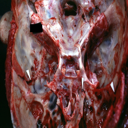

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone, calvarium


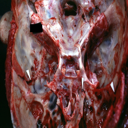

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


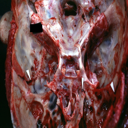

###################################################################
Question:  how is close - up view of base of skull with shown shown fractures?
Predicted Answer:  large
Actual Answer:  several


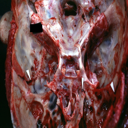

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  close - up view of lesions slide which is brain from case


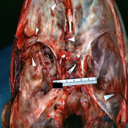

###################################################################
Question:  does this image show close - up view of lesions slide which is brain from this case?
Predicted Answer:  yes
Actual Answer:  yes


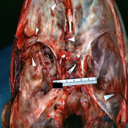

###################################################################
Question:  are skin stem cells classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  no


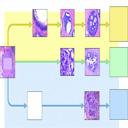

###################################################################
Question:  does inflamed exocervix show close - up view of lesions slide which is brain from this case?
Predicted Answer:  no
Actual Answer:  no


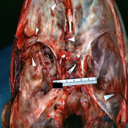

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone


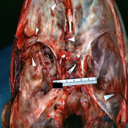

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


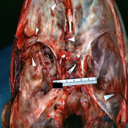

###################################################################
Question:  is focal hemorrhagic infarction well shown present?
Predicted Answer:  no
Actual Answer:  no


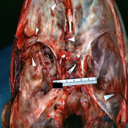

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  basilar skull fracture


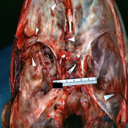

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


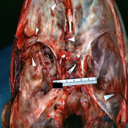

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


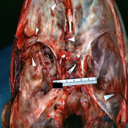

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone, calvarium


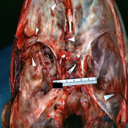

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  basilar skull fracture


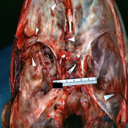

###################################################################
Question:  what is slide?
Predicted Answer:  this fixed tissue
Actual Answer:  fractures brain which and close - up view of these fractures


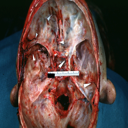

###################################################################
Question:  what is the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  the central dermal component
Actual Answer:  luminal


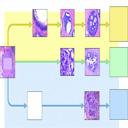

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  fractures
Actual Answer:  fractures


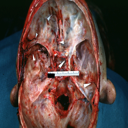

###################################################################
Question:  is fractures brain which is slide and close - up view of these fractures slide?
Predicted Answer:  yes
Actual Answer:  yes


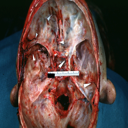

###################################################################
Question:  is lateral view of head with ear lobe crease and web neck other photos in file slide?
Predicted Answer:  no
Actual Answer:  no


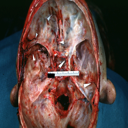

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  fractures brain which is slide and close - up view of these fractures is slide


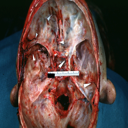

###################################################################
Question:  does this image show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  yes
Actual Answer:  yes


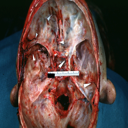

###################################################################
Question:  does nipple duplication show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  no
Actual Answer:  no


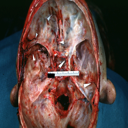

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone


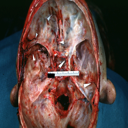

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


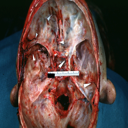

###################################################################
Question:  is intraductal papillomatosis with apocrine metaplasia present?
Predicted Answer:  no
Actual Answer:  no


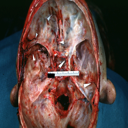

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


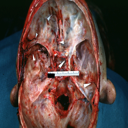

###################################################################
Question:  is the remote kidney infarct replaced by a large fibrotic scar?
Predicted Answer:  yes
Actual Answer:  yes


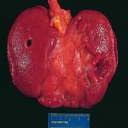

###################################################################
Question:  is this the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  yes


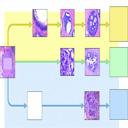

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  yes
Actual Answer:  yes


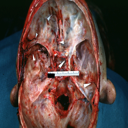

###################################################################
Question:  is acid present?
Predicted Answer:  yes
Actual Answer:  no


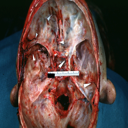

###################################################################
Question:  what is slide?
Predicted Answer:  this fixed tissue
Actual Answer:  fractures brain which and close - up view of these fractures


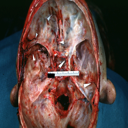

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  fractures
Actual Answer:  fractures


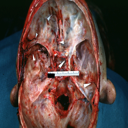

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone, calvarium


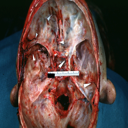

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


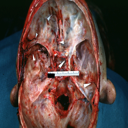

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  head tilted with mouth


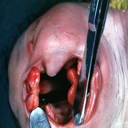

###################################################################
Question:  how does this image show head tilted?
Predicted Answer:  with mouth
Actual Answer:  with mouth


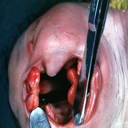

###################################################################
Question:  does this image show head tilted with mouth?
Predicted Answer:  yes
Actual Answer:  yes


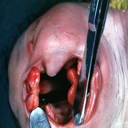

###################################################################
Question:  does anencephaly show head tilted with mouth?
Predicted Answer:  no
Actual Answer:  no


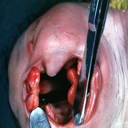

###################################################################
Question:  is show flow cytometry the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  no


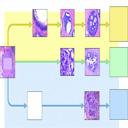

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  face


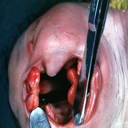

###################################################################
Question:  is face present?
Predicted Answer:  yes
Actual Answer:  yes


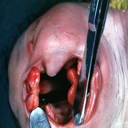

###################################################################
Question:  is opened uterus and cervix with large cervical myoma protruding into vagina slide present?
Predicted Answer:  no
Actual Answer:  no


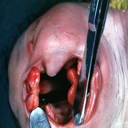

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bilateral cleft palate


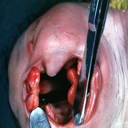

###################################################################
Question:  is bilateral cleft palate present?
Predicted Answer:  yes
Actual Answer:  yes


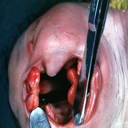

###################################################################
Question:  is newborn cord around neck present?
Predicted Answer:  no
Actual Answer:  no


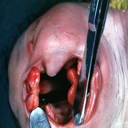

###################################################################
Question:  what opened to show large defect very good illustration of this lesion?
Predicted Answer:  head tilted with mouth
Actual Answer:  head tilted with mouth


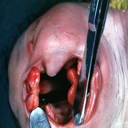

###################################################################
Question:  what is head tilted with mouth opened?
Predicted Answer:  to show large defect very good illustration of this lesion
Actual Answer:  to show large defect very good illustration of this lesion


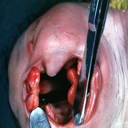

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  face


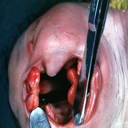

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bilateral cleft palate


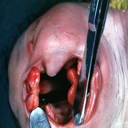

###################################################################
Question:  what is atypical apocrine adenosis, which shares features with apocrine dcis?
Predicted Answer:  the central area
Actual Answer:  a possible precursor lesion


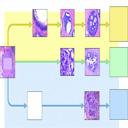

###################################################################
Question:  how is head tilted with mouth opened to show defect very good illustration of this lesion?
Predicted Answer:  large
Actual Answer:  large


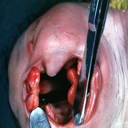

###################################################################
Question:  how is head tilted with mouth opened to show large defect very illustration of this lesion?
Predicted Answer:  good
Actual Answer:  good


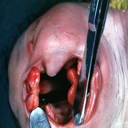

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone


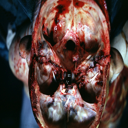

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


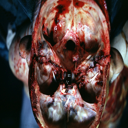

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


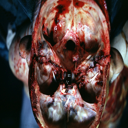

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  yes
Actual Answer:  yes


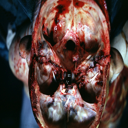

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  bone, calvarium


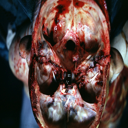

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  basilar skull fracture


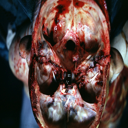

###################################################################
Question:  what does this image show?
Predicted Answer:  rocky mountain
Actual Answer:  multiple fractures very well


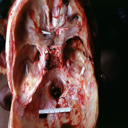

###################################################################
Question:  does this image show multiple fractures very well?
Predicted Answer:  yes
Actual Answer:  yes


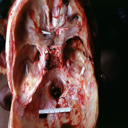

###################################################################
Question:  what is a possible precursor lesion, which shares features with apocrine dcis?
Predicted Answer:  atypical apocrine adenosis
Actual Answer:  atypical apocrine adenosis


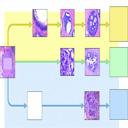

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone


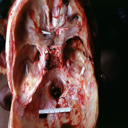

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  yes
Actual Answer:  yes


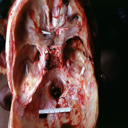

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  basilar skull fracture


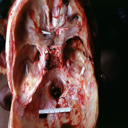

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  yes
Actual Answer:  yes


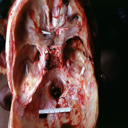

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  bone, calvarium


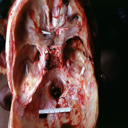

###################################################################
Question:  what is present?
Predicted Answer:  rocky mountain
Actual Answer:  basilar skull fracture


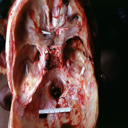

###################################################################
Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  face


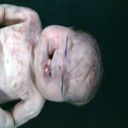

###################################################################


In [ ]:
for x in range(500,600):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Question:  what is present?
Predicted Answer:  this lesion
Actual Answer:  potters facies


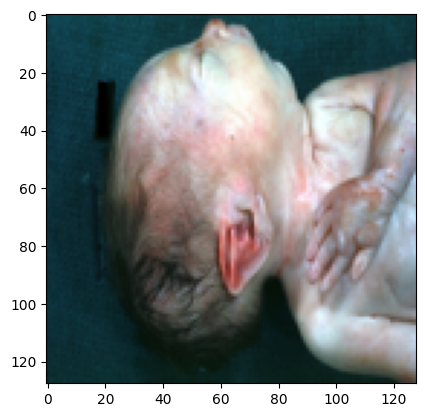

In [ ]:
idx = 751
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  does this image show stenosis of foramen magnum due to subluxation of atlas vertebra case 31?
Predicted Answer:  yes
Actual Answer:  yes


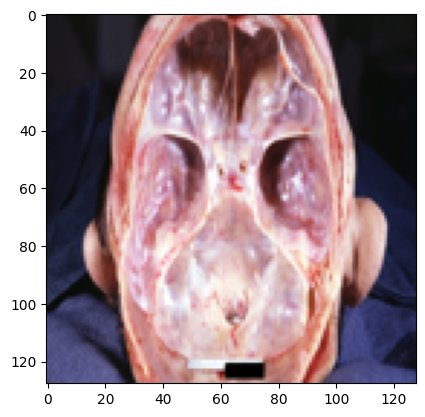

In [ ]:
idx = 700
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is beckwith - wiedemann syndrome present?
Predicted Answer:  yes
Actual Answer:  no


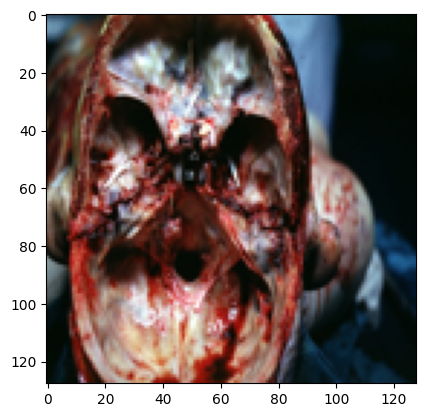

In [ ]:
idx = 720
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is thymus present?
Predicted Answer:  yes
Actual Answer:  yes


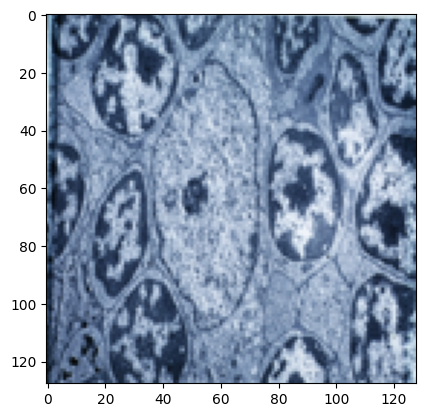

In [ ]:
idx = 790
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  where is this part in?
Predicted Answer:  a very good example
Actual Answer:  spleen


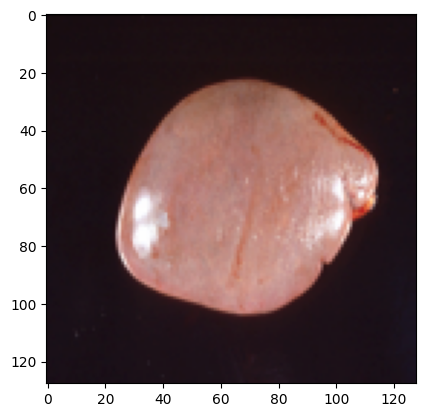

In [ ]:
idx = 885
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  does this image show spleen, normal?
Predicted Answer:  yes
Actual Answer:  yes


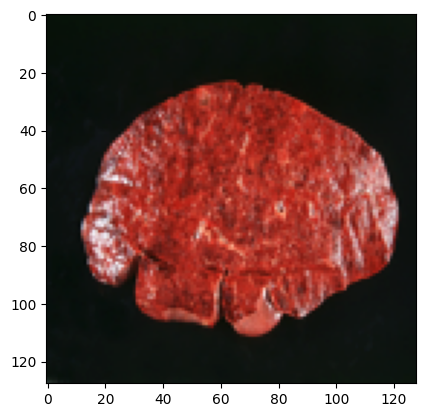

In [ ]:
idx = 822
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  what does this image show?
Predicted Answer:  this lesion
Actual Answer:  x - ray showing large sella turcica


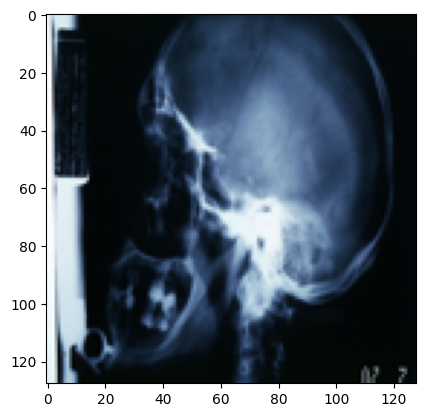

In [ ]:
idx = 770
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

Question:  is chromophobe adenoma present?
Predicted Answer:  yes
Actual Answer:  yes


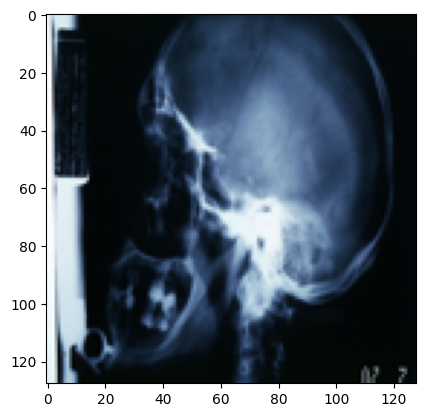

In [ ]:
idx = 777
sample = val_vqa_dataset[idx]
print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

# forward pass
outputs = model.generate(pixel_values=sample['pixel_values'],
                        input_ids=sample['input_ids'])
print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
#########################################################################
unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
plt.imshow(Image.fromarray(unnormalized_image))

## Conclusion

A successfully trained and inferred medical Visual Question Answering model has the potential to revolutionize healthcare by enhancing diagnostic accuracy, improving efficiency, and expanding access to medical information. However, careful consideration of ethical, privacy, and regulatory issues is crucial to ensure its safe and responsible use in clinical practice.